<div style="background:linear-gradient(135deg,#0f2027,#203a43,#2c5364);padding:40px 30px;border-radius:12px;margin-bottom:20px">
<h1 style="color:#00d4ff;font-size:2.4em;margin:0 0 8px">🎯 Computer Vision with OpenCV & YOLO</h1>
<h3 style="color:#a0c4d8;font-weight:400;margin:0 0 20px">A Practical Lightweight Course</h3>
<div style="display:flex;gap:12px;flex-wrap:wrap">
<span style="background:#00d4ff22;border:1px solid #00d4ff55;color:#00d4ff;padding:4px 14px;border-radius:20px;font-size:0.85em">👤 TCHAPGA TCHITO C.</span>
<span style="background:#00d4ff22;border:1px solid #00d4ff55;color:#00d4ff;padding:4px 14px;border-radius:20px;font-size:0.85em">🏫 University of Buea — COLTECH</span>
<span style="background:#00d4ff22;border:1px solid #00d4ff55;color:#00d4ff;padding:4px 14px;border-radius:20px;font-size:0.85em">📅 2025/2026</span>
<span style="background:#00d4ff22;border:1px solid #00d4ff55;color:#00d4ff;padding:4px 14px;border-radius:20px;font-size:0.85em">🐍 Python + OpenCV + Ultralytics</span>
</div>
</div>

---

## 📋 Course Outline

| # | Topic | Key Skills |
|---|-------|------------|
| 1 | Introduction to Computer Vision | Images as arrays, pixel manipulation |
| 2 | OpenCV Basics | Read, display, draw, color spaces |
| 3 | Image Processing | Blur, edges, thresholding, morphology |
| 4 | Video & Webcam | Frame capture, real-time processing |
| 5 | Object Detection — Haar Cascades | Face & eye detection |
| 6 | YOLO with Ultralytics | Inference, detection, segmentation |
| 7 | Application 1 | Face Blur / Privacy Tool |
| 8 | Application 2 | Real-Time Object Counter |
| 9 | Application 3 | Motion Detector |
|10 | Application 4 | Document Scanner |

> **Prerequisites:** Basic Python. No deep learning background required for most sections.

---
## ⚙️ Installation & Imports

In [1]:
# Install required libraries (run once)
# !pip install opencv-python opencv-contrib-python ultralytics matplotlib numpy pillow requests

import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from pathlib import Path
import urllib.request
import warnings
warnings.filterwarnings('ignore')

# Helper: display images inline (Jupyter-friendly, no cv2.imshow needed)
def show(img, title='', figsize=(8,5), cmap=None):
    """Display a BGR (OpenCV) or grayscale image in Jupyter."""
    fig, ax = plt.subplots(figsize=figsize)
    if len(img.shape) == 3:
        ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    else:
        ax.imshow(img, cmap='gray')
    ax.set_title(title, fontsize=13, fontweight='bold')
    ax.axis('off')
    plt.tight_layout()
    plt.show()

def show_multi(images, titles, cols=3, figsize=(15,5)):
    """Display multiple images side by side."""
    rows = (len(images) + cols - 1) // cols
    fig, axes = plt.subplots(rows, cols, figsize=figsize)
    axes = np.array(axes).flatten()
    for ax, img, title in zip(axes, images, titles):
        if len(img.shape) == 3:
            ax.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        else:
            ax.imshow(img, cmap='gray')
        ax.set_title(title, fontsize=11)
        ax.axis('off')
    for ax in axes[len(images):]:
        ax.axis('off')
    plt.tight_layout()
    plt.show()

print(f'OpenCV version : {cv2.__version__}')
print('All imports OK ✅')

OpenCV version : 4.12.0
All imports OK ✅


---
## 1 · Introduction to Computer Vision

<div style="background:#1a1a2e;border-left:4px solid #00d4ff;padding:16px;border-radius:6px;color:#e0e0e0">
<b>Computer Vision</b> is the field of AI that teaches machines to <em>see</em> and <em>interpret</em> visual data — images and videos — the way humans do.
</div>

### Key Applications
| Domain | Examples |
|--------|----------|
| Healthcare | X-ray analysis, tumour detection, surgical assistance |
| Autonomous Vehicles | Lane detection, pedestrian recognition, traffic signs |
| Security | Face recognition, anomaly detection, crowd analysis |
| Manufacturing | Defect inspection, quality control, robot guidance |
| Agriculture | Crop disease detection, yield estimation, drone mapping |
| Retail | Cashierless stores, shelf monitoring, customer analytics |

### Images are Arrays of Numbers

Gray  shape: (200, 300)   dtype: uint8
Color shape: (200, 300, 3)   dtype: uint8
Pixel at (100,150) [gray]: 255
Pixel at (100,150) [color]: [  0 165 255]  ← (B, G, R)


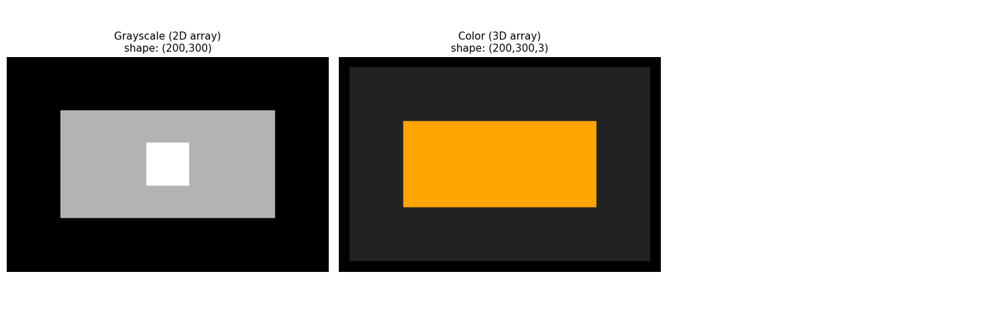

In [2]:
# ─── 1.1  Create a synthetic image from scratch ───────────────────────────────

# Grayscale image: 2D array, values 0 (black) → 255 (white)
gray_img = np.zeros((200, 300), dtype=np.uint8)
gray_img[50:150, 50:250] = 180        # draw a gray rectangle
gray_img[80:120, 130:170] = 255       # bright square inside

# Color image: 3D array [Height, Width, Channels]  →  BGR order in OpenCV!
color_img = np.zeros((200, 300, 3), dtype=np.uint8)
color_img[10:190, 10:290] = (34, 34, 34)   # dark background
color_img[60:140, 60:240] = (0, 165, 255)  # orange rectangle (BGR)

print('Gray  shape:', gray_img.shape,  '  dtype:', gray_img.dtype)
print('Color shape:', color_img.shape, '  dtype:', color_img.dtype)
print('Pixel at (100,150) [gray]:', gray_img[100, 150])
print('Pixel at (100,150) [color]:', color_img[100, 150], ' ← (B, G, R)')

show_multi([gray_img, color_img],
           ['Grayscale (2D array)\nshape: (200,300)',
            'Color (3D array)\nshape: (200,300,3)'])

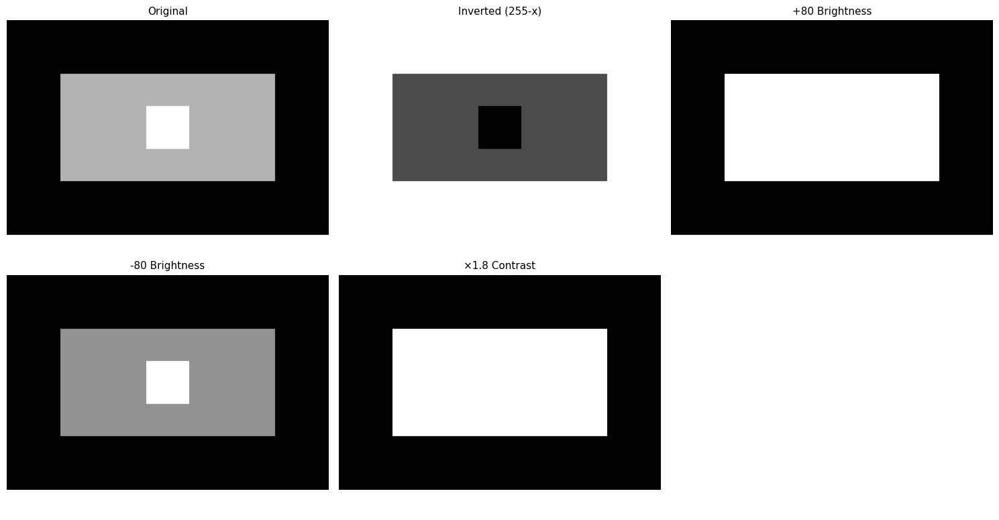

In [3]:
# ─── 1.2  Pixel-level operations ─────────────────────────────────────────────

# Invert image
inverted = 255 - gray_img

# Brightness: add constant (clip to 0-255)
bright  = np.clip(gray_img.astype(int) + 80, 0, 255).astype(np.uint8)
dark    = np.clip(gray_img.astype(int) - 80, 0, 255).astype(np.uint8)

# Contrast: multiply
contrast = np.clip(gray_img.astype(float) * 1.8, 0, 255).astype(np.uint8)

show_multi([gray_img, inverted, bright, dark, contrast],
           ['Original', 'Inverted (255-x)', '+80 Brightness',
            '-80 Brightness', '×1.8 Contrast'],
           cols=3, figsize=(15,8))

---
## 2 · OpenCV Basics

### 2.1  Reading, Writing & Displaying Images

Color  : shape=(512, 512, 3)   dtype=uint8
Gray   : shape=(512, 512) dtype=uint8
Saved cv_assets/lena_gray.png


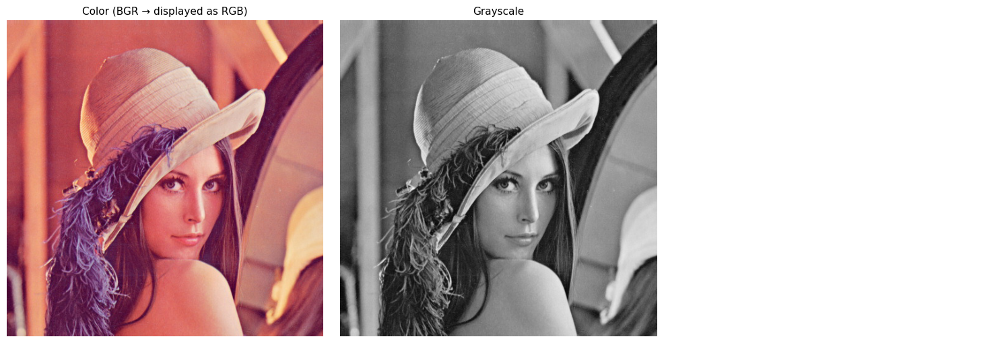

In [11]:
# Download a sample image (Lena — classic CV test image)
import urllib.request, os

os.makedirs('cv_assets', exist_ok=True)

sample_url  = 'https://raw.githubusercontent.com/opencv/opencv/master/samples/data/lena.jpg'
sample_path = 'cv_assets/lena.jpg'

if not os.path.exists(sample_path):
    urllib.request.urlretrieve(sample_url, sample_path)
    print('Downloaded lena.jpg')

# ── Read ──────────────────────────────────────────────────────────────────────
img   = cv2.imread(sample_path)              # BGR, full color
img_g = cv2.imread(sample_path, cv2.IMREAD_GRAYSCALE)  # grayscale

print(f'Color  : shape={img.shape}   dtype={img.dtype}')
print(f'Gray   : shape={img_g.shape} dtype={img_g.dtype}')

# ── Write ─────────────────────────────────────────────────────────────────────
cv2.imwrite('cv_assets/lena_gray.png', img_g)   # saves grayscale
print('Saved cv_assets/lena_gray.png')

show_multi([img, img_g], ['Color (BGR → displayed as RGB)', 'Grayscale'])

### 2.2  Color Spaces

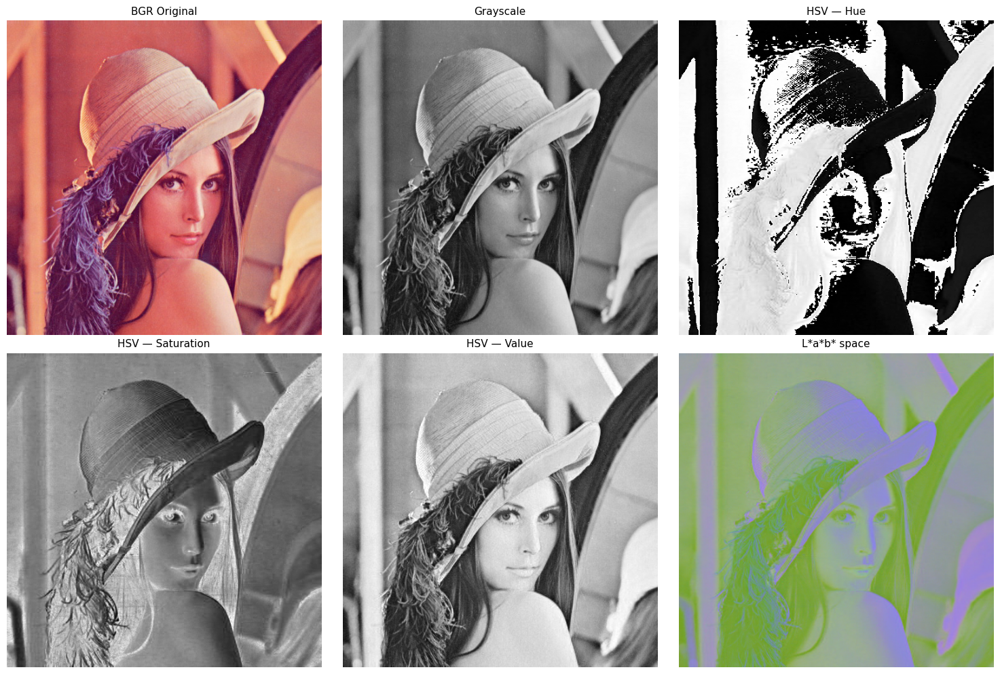


Color Space Cheat Sheet
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
BGR  → default in OpenCV (Blue, Green, Red)
RGB  → standard for matplotlib / PIL
GRAY → single channel, 0-255
HSV  → Hue [0-179], Saturation [0-255], Value [0-255]
       Best for colour-based filtering (skin, traffic lights)
LAB  → perceptually uniform; good for colour matching



In [8]:
# ─── Color space conversions ──────────────────────────────────────────────────
rgb  = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
hsv  = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
lab  = cv2.cvtColor(img, cv2.COLOR_BGR2LAB)

# Show HSV channels
h, s, v = cv2.split(hsv)

show_multi(
    [img, gray, h, s, v, lab],
    ['BGR Original', 'Grayscale',
     'HSV — Hue', 'HSV — Saturation', 'HSV — Value',
     'L*a*b* space'],
    cols=3, figsize=(15,10)
)

print("""
Color Space Cheat Sheet
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
BGR  → default in OpenCV (Blue, Green, Red)
RGB  → standard for matplotlib / PIL
GRAY → single channel, 0-255
HSV  → Hue [0-179], Saturation [0-255], Value [0-255]
       Best for colour-based filtering (skin, traffic lights)
LAB  → perceptually uniform; good for colour matching
""")

### 2.3  Drawing on Images

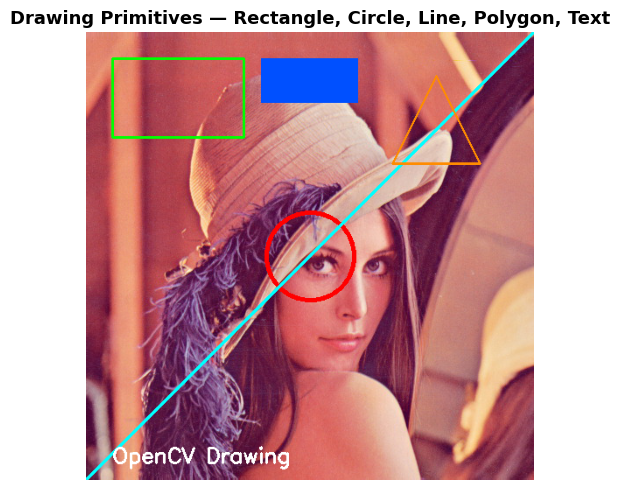

In [9]:
# ─── Drawing primitives ───────────────────────────────────────────────────────
canvas = img.copy()
H, W = canvas.shape[:2]

# Rectangle: (image, top-left, bottom-right, BGR_color, thickness)
cv2.rectangle(canvas, (30, 30), (180, 120), (0, 255, 0), 2)        # green box

# Filled rectangle
cv2.rectangle(canvas, (200, 30), (310, 80), (255, 80, 0), -1)       # filled blue

# Circle: (image, center, radius, color, thickness)
cv2.circle(canvas, (W//2, H//2), 50, (0, 0, 255), 3)               # red circle

# Line: (image, pt1, pt2, color, thickness)
cv2.line(canvas, (0, H-1), (W-1, 0), (255, 255, 0), 2)             # cyan diagonal

# Polygon
pts = np.array([[400,50],[450,150],[350,150]], dtype=np.int32)
cv2.polylines(canvas, [pts], isClosed=True, color=(0,140,255), thickness=2)

# Text: (image, text, org, font, scale, color, thickness)
cv2.putText(canvas, 'OpenCV Drawing', (30, H-20),
            cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,255), 2)

show(canvas, 'Drawing Primitives — Rectangle, Circle, Line, Polygon, Text')

### 2.4  Geometric Transformations

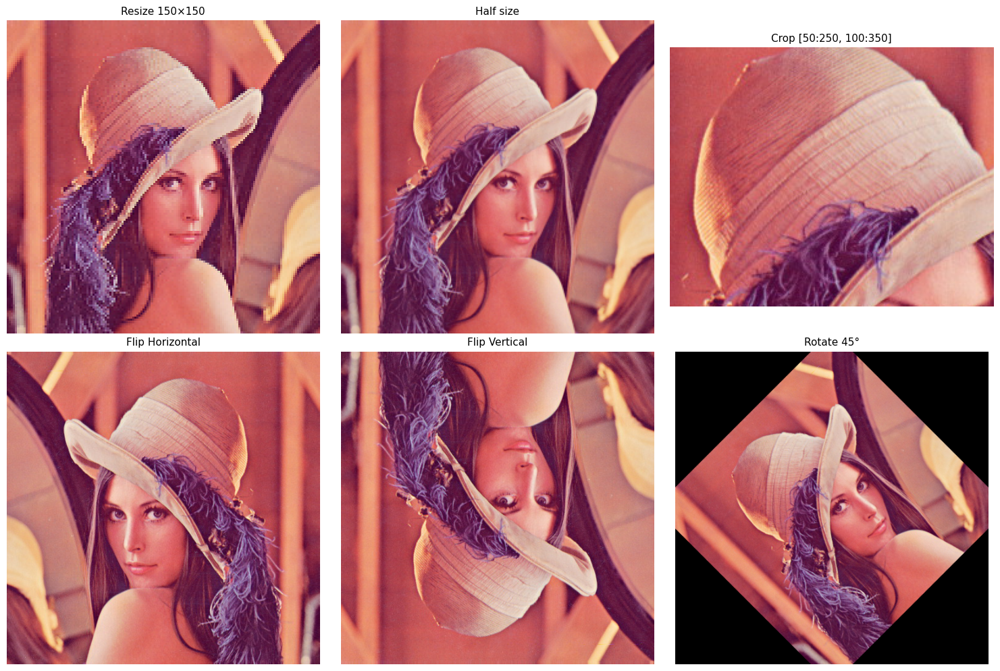

In [12]:
# ─── Resize, Crop, Flip, Rotate ──────────────────────────────────────────────
H, W = img.shape[:2]

# Resize
small    = cv2.resize(img, (150, 150))
half     = cv2.resize(img, (W//2, H//2))             # half size
stretched= cv2.resize(img, (W, H//2))                # squish vertical

# Crop (NumPy slicing:  img[y1:y2, x1:x2])
crop = img[50:250, 100:350]

# Flip: 0=vertical, 1=horizontal, -1=both
flip_h = cv2.flip(img, 1)
flip_v = cv2.flip(img, 0)

# Rotate 45°
M = cv2.getRotationMatrix2D((W//2, H//2), angle=45, scale=0.8)
rotated = cv2.warpAffine(img, M, (W, H))

show_multi(
    [small, half, crop, flip_h, flip_v, rotated],
    ['Resize 150×150', 'Half size', 'Crop [50:250, 100:350]',
     'Flip Horizontal', 'Flip Vertical', 'Rotate 45°'],
    cols=3, figsize=(15,10)
)

---
## 3 · Image Processing

### 3.1  Blurring & Noise Reduction

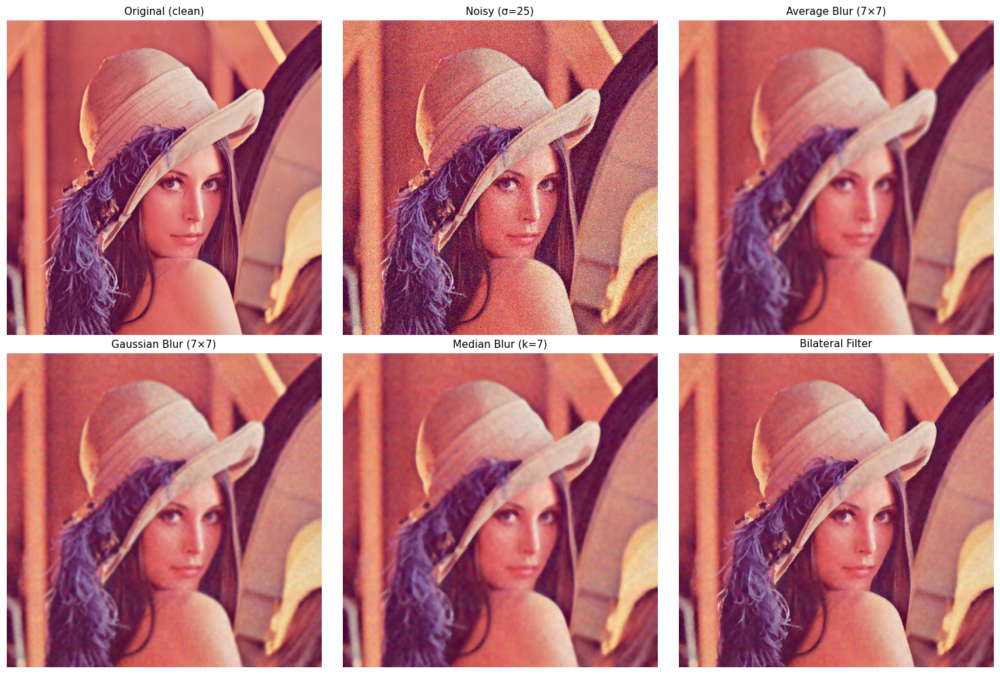


Filter Guide
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
Average   → simple, fast, blurs edges
Gaussian  → smooth, reduces Gaussian noise best
Median    → best for salt-and-pepper noise, preserves edges
Bilateral → edge-preserving, good for portrait smoothing



In [13]:
# ─── Add synthetic noise then remove it ──────────────────────────────────────
noisy = img.copy().astype(np.float32)
noisy += np.random.normal(0, 25, noisy.shape)
noisy = np.clip(noisy, 0, 255).astype(np.uint8)

# Blurring methods
blur_avg    = cv2.blur(noisy, (7,7))                      # Average / Box filter
blur_gauss  = cv2.GaussianBlur(noisy, (7,7), sigmaX=2)   # Gaussian (preserves edges better)
blur_median = cv2.medianBlur(noisy, 7)                    # Median (best for salt-and-pepper)
blur_bilat  = cv2.bilateralFilter(noisy, d=9, sigmaColor=75, sigmaSpace=75)  # Bilateral (edge-preserving)

show_multi(
    [img, noisy, blur_avg, blur_gauss, blur_median, blur_bilat],
    ['Original (clean)', 'Noisy (σ=25)',
     'Average Blur (7×7)', 'Gaussian Blur (7×7)',
     'Median Blur (k=7)', 'Bilateral Filter'],
    cols=3, figsize=(15,10)
)

print("""
Filter Guide
━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━
Average   → simple, fast, blurs edges
Gaussian  → smooth, reduces Gaussian noise best
Median    → best for salt-and-pepper noise, preserves edges
Bilateral → edge-preserving, good for portrait smoothing
""")

### 3.2  Edge Detection

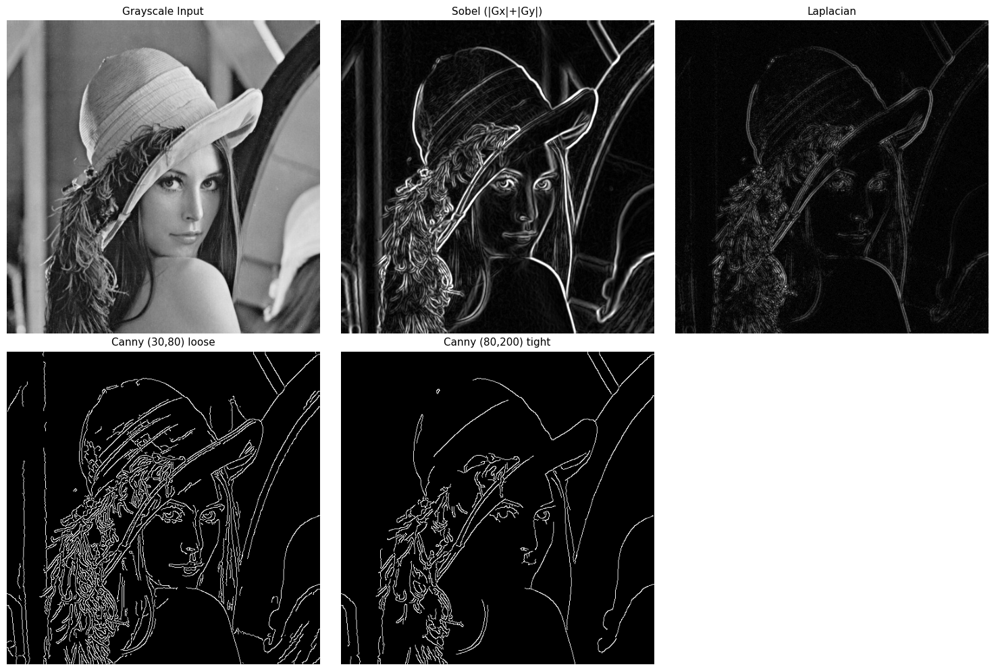

In [14]:
# ─── Edge detection methods ───────────────────────────────────────────────────
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
smooth = cv2.GaussianBlur(gray, (5,5), 0)   # pre-smooth for better edges

# Sobel (directional gradient)
sobel_x = cv2.Sobel(smooth, cv2.CV_64F, 1, 0, ksize=3)
sobel_y = cv2.Sobel(smooth, cv2.CV_64F, 0, 1, ksize=3)
sobel   = cv2.magnitude(sobel_x, sobel_y)
sobel   = np.clip(sobel, 0, 255).astype(np.uint8)

# Laplacian (second derivative, isotropic)
laplacian = cv2.Laplacian(smooth, cv2.CV_64F)
laplacian = np.uint8(np.absolute(laplacian))

# Canny (gold standard: noise reduction + double threshold + edge tracking)
canny_loose = cv2.Canny(smooth, threshold1=30,  threshold2=80)
canny_tight = cv2.Canny(smooth, threshold1=80,  threshold2=200)

show_multi(
    [gray, sobel, laplacian, canny_loose, canny_tight],
    ['Grayscale Input', 'Sobel (|Gx|+|Gy|)', 'Laplacian',
     'Canny (30,80) loose', 'Canny (80,200) tight'],
    cols=3, figsize=(15,10)
)

### 3.3  Thresholding

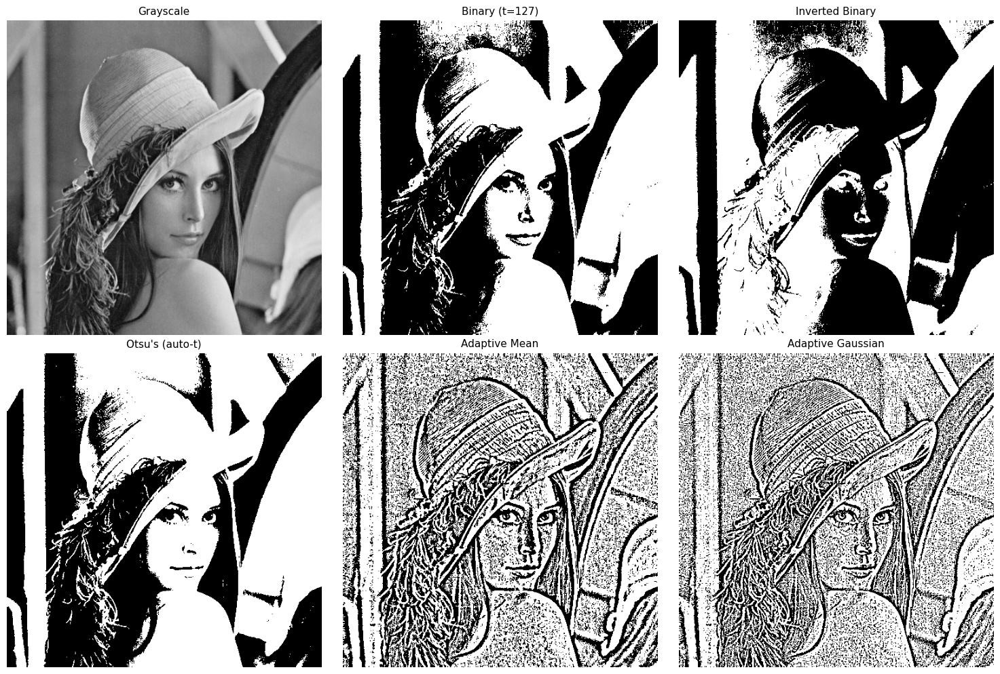

In [15]:
# ─── Thresholding: convert grayscale to binary ────────────────────────────────
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Global threshold
_, th_binary   = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY)
_, th_inv      = cv2.threshold(gray, 127, 255, cv2.THRESH_BINARY_INV)
_, th_trunc    = cv2.threshold(gray, 127, 255, cv2.THRESH_TRUNC)

# Otsu's method: automatically finds optimal threshold
_, th_otsu = cv2.threshold(gray, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Adaptive threshold: different threshold per local neighbourhood
th_adapt_mean = cv2.adaptiveThreshold(gray, 255,
    cv2.ADAPTIVE_THRESH_MEAN_C,    cv2.THRESH_BINARY, 11, 2)
th_adapt_gauss= cv2.adaptiveThreshold(gray, 255,
    cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2)

show_multi(
    [gray, th_binary, th_inv, th_otsu, th_adapt_mean, th_adapt_gauss],
    ['Grayscale', 'Binary (t=127)', 'Inverted Binary',
     "Otsu's (auto-t)", 'Adaptive Mean', 'Adaptive Gaussian'],
    cols=3, figsize=(15,10)
)

### 3.4  Morphological Operations

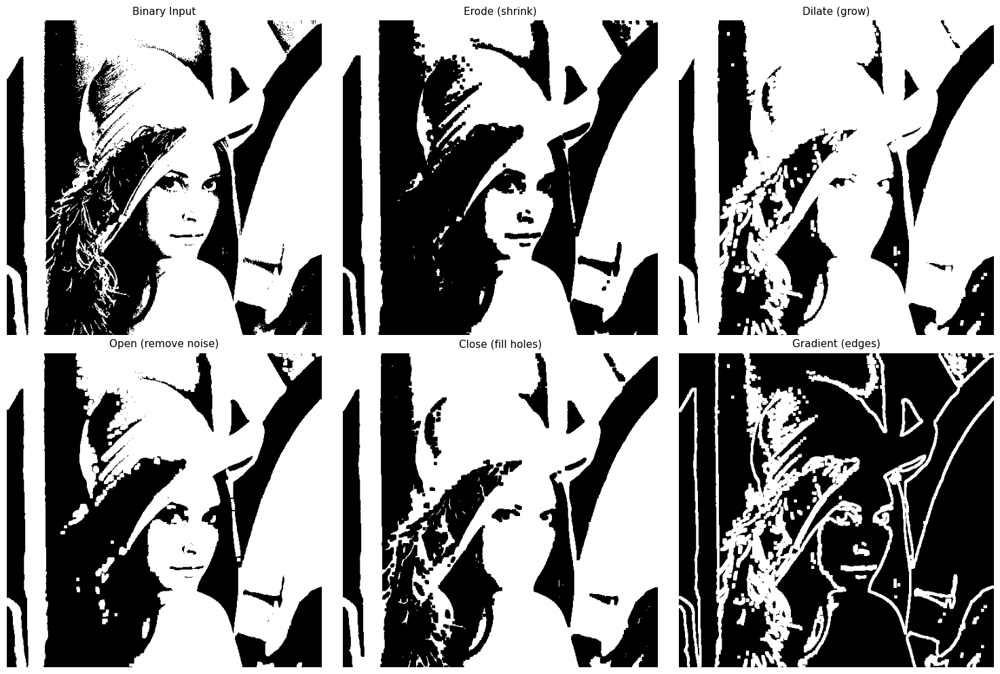

In [16]:
# ─── Morphology: clean binary masks ──────────────────────────────────────────
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (5,5))
binary = th_otsu.copy()

eroded   = cv2.erode(binary, kernel, iterations=1)      # shrinks white regions
dilated  = cv2.dilate(binary, kernel, iterations=1)     # grows white regions
opened   = cv2.morphologyEx(binary, cv2.MORPH_OPEN, kernel)   # erode→dilate (removes noise)
closed   = cv2.morphologyEx(binary, cv2.MORPH_CLOSE, kernel)  # dilate→erode (fills holes)
gradient = cv2.morphologyEx(binary, cv2.MORPH_GRADIENT, kernel) # dilation-erosion = edges

show_multi(
    [binary, eroded, dilated, opened, closed, gradient],
    ['Binary Input', 'Erode (shrink)', 'Dilate (grow)',
     'Open (remove noise)', 'Close (fill holes)', 'Gradient (edges)'],
    cols=3, figsize=(15,10)
)

### 3.5  Contours & Shape Analysis

Shape 1: area=25190  perimeter=596  bbox=(340,160,181,181)
Shape 2: area=20500  perimeter=564  bbox=(50,150,201,171)
Shape 3: area=10800  perimeter=420  bbox=(30,30,121,91)
Shape 4: area=17273  perimeter=525  bbox=(330,25,201,111)
Shape 5: area=15176  perimeter=462  bbox=(180,10,141,141)


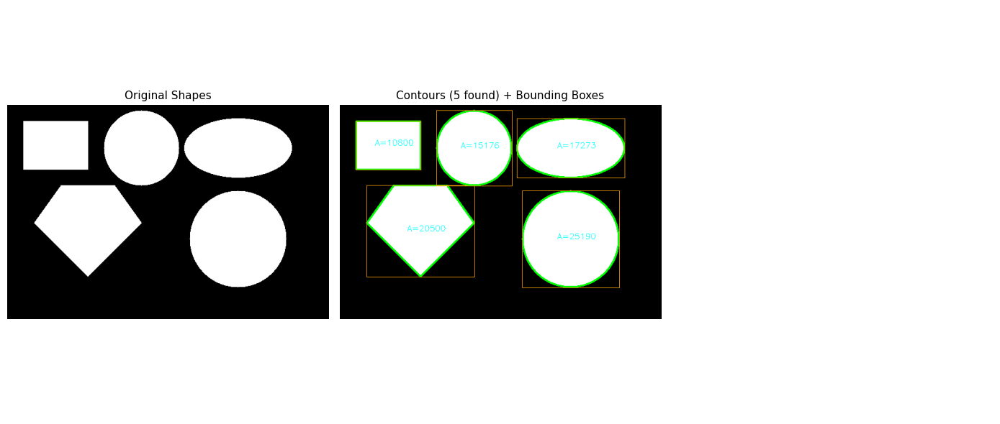

In [17]:
# ─── Contour detection & shape properties ────────────────────────────────────
# Create synthetic shapes
shape_canvas = np.zeros((400, 600, 3), dtype=np.uint8)
cv2.rectangle(shape_canvas, (30,  30),  (150, 120), (255,255,255), -1)
cv2.circle(shape_canvas,    (250, 80),  70,          (255,255,255), -1)
cv2.ellipse(shape_canvas,   (430, 80),  (100,55), 0, 0, 360, (255,255,255), -1)
pts = np.array([[50,220],[150,320],[250,220],[200,150],[100,150]], np.int32)
cv2.fillPoly(shape_canvas, [pts], (255,255,255))
cv2.circle(shape_canvas,   (430,250), 90, (255,255,255), -1)

gray_shapes = cv2.cvtColor(shape_canvas, cv2.COLOR_BGR2GRAY)
_, binary_shapes = cv2.threshold(gray_shapes, 10, 255, cv2.THRESH_BINARY)

# Find contours
contours, hierarchy = cv2.findContours(
    binary_shapes, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE
)

result = shape_canvas.copy()
for i, cnt in enumerate(contours):
    area      = cv2.contourArea(cnt)
    perimeter = cv2.arcLength(cnt, closed=True)
    x, y, w, h= cv2.boundingRect(cnt)
    cx, cy    = x + w//2, y + h//2

    cv2.drawContours(result, [cnt], -1, (0,255,0), 2)
    cv2.rectangle(result, (x,y), (x+w, y+h), (0,165,255), 1)
    label = f'A={int(area)}'  
    cv2.putText(result, label, (cx-25, cy), cv2.FONT_HERSHEY_SIMPLEX,
                0.5, (255,255,0), 1)
    print(f'Shape {i+1}: area={area:.0f}  perimeter={perimeter:.0f}  bbox=({x},{y},{w},{h})')

show_multi([shape_canvas, result],
           ['Original Shapes', f'Contours ({len(contours)} found) + Bounding Boxes'],
           figsize=(14,6))

---
## 4 · Video & Webcam Processing

<div style="background:#1a1a2e;border-left:4px solid #ffa500;padding:14px;border-radius:6px;color:#e0e0e0">
⚠️ <b>Note:</b> Code blocks below use <code>cv2.VideoCapture</code>. In Jupyter, replace <code>cv2.imshow</code> with the <code>show()</code> helper or save frames to disk. A standalone <code>.py</code> script is provided at the end of each section.
</div>

In [18]:
# ─── 4.1  Read video from file ────────────────────────────────────────────────
# cap = cv2.VideoCapture('your_video.mp4')   # file
# cap = cv2.VideoCapture(0)                  # webcam index 0

print("""
Video Capture Template
══════════════════════════════════════════════════════
import cv2

cap = cv2.VideoCapture(0)   # 0 = first webcam

# VideoWriter to save output
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('output.mp4', fourcc, 30, (640, 480))

while cap.isOpened():
    ret, frame = cap.read()        # ret=True if frame is valid
    if not ret:
        break

    # ─── Process frame here ───
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    processed = cv2.Canny(gray, 50, 150)
    processed_bgr = cv2.cvtColor(processed, cv2.COLOR_GRAY2BGR)

    # Display FPS
    cv2.putText(frame, f'Frame: {cap.get(cv2.CAP_PROP_POS_FRAMES):.0f}',
                (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)

    cv2.imshow('Original', frame)
    cv2.imshow('Edges',    processed)
    out.write(processed_bgr)

    if cv2.waitKey(1) & 0xFF == ord('q'):   # press Q to quit
        break

cap.release()
out.release()
cv2.destroyAllWindows()
""")


Video Capture Template
══════════════════════════════════════════════════════
import cv2

cap = cv2.VideoCapture(0)   # 0 = first webcam

# VideoWriter to save output
fourcc = cv2.VideoWriter_fourcc(*'mp4v')
out = cv2.VideoWriter('output.mp4', fourcc, 30, (640, 480))

while cap.isOpened():
    ret, frame = cap.read()        # ret=True if frame is valid
    if not ret:
        break

    # ─── Process frame here ───
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    processed = cv2.Canny(gray, 50, 150)
    processed_bgr = cv2.cvtColor(processed, cv2.COLOR_GRAY2BGR)

    # Display FPS
    cv2.putText(frame, f'Frame: {cap.get(cv2.CAP_PROP_POS_FRAMES):.0f}',
                (10,30), cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)

    cv2.imshow('Original', frame)
    cv2.imshow('Edges',    processed)
    out.write(processed_bgr)

    if cv2.waitKey(1) & 0xFF == ord('q'):   # press Q to quit
        break

cap.release()
out.release()
cv2.destroyAllWindows()



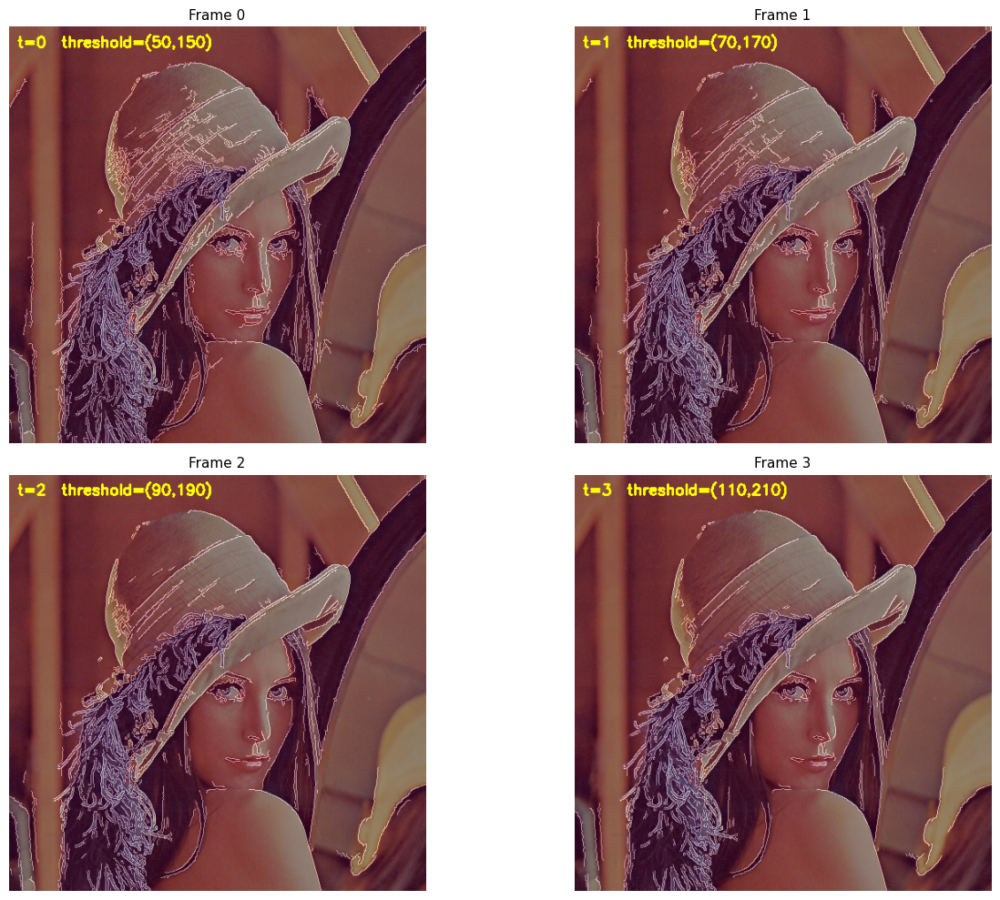

In [19]:
# ─── 4.2  Simulate frame processing (Jupyter mode) ───────────────────────────
# We load 4 'frames' from our static image by applying time-varying effects

base = img.copy()
frames = []
for t in range(4):
    frame = base.copy()
    gray_f = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    edges  = cv2.Canny(gray_f, 50 + t*20, 150 + t*20)
    colored_edges = cv2.cvtColor(edges, cv2.COLOR_GRAY2BGR)
    combined = cv2.addWeighted(frame, 0.6, colored_edges, 0.4, 0)
    cv2.putText(combined, f't={t}  threshold=({50+t*20},{150+t*20})',
                (10,25), cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0,255,255), 2)
    frames.append(combined)

show_multi(frames, [f'Frame {i}' for i in range(4)], cols=2, figsize=(14,10))

---
## 5 · Object Detection — Haar Cascades

Haar cascades are **fast, classical** detectors trained with AdaBoost. They're not as accurate as deep learning but run without GPU.

  face cascade: cv_assets/haarcascade_frontalface_default.xml
  eye cascade: cv_assets/haarcascade_eye.xml
  smile cascade: cv_assets/haarcascade_smile.xml
Faces detected: 1


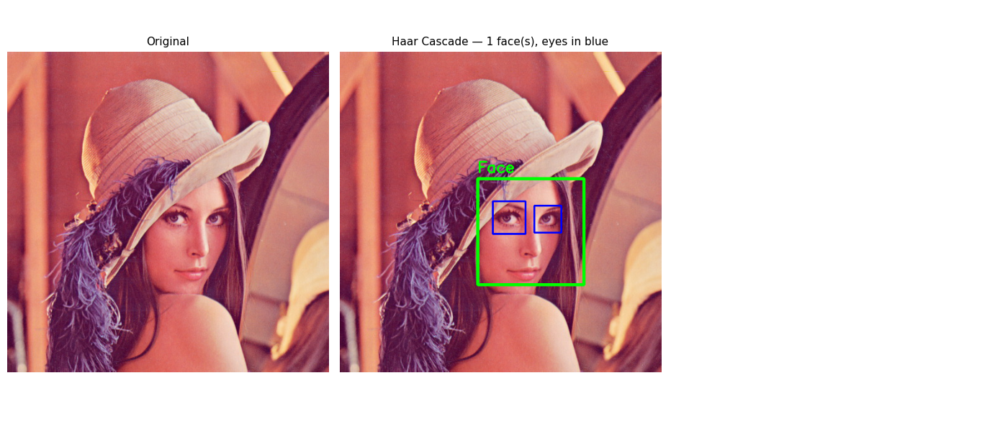

In [22]:
# ─── 5.1  Face & Eye detection ────────────────────────────────────────────────
import urllib.request, os

# Download cascade XML files
base_url = 'https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/'
cascades = {
    'face': 'haarcascade_frontalface_default.xml',
    'eye' : 'haarcascade_eye.xml',
    'smile': 'haarcascade_smile.xml',
}
for name, fname in cascades.items():
    path = f'cv_assets/{fname}'
    if not os.path.exists(path):
        urllib.request.urlretrieve(base_url + fname, path)
    print(f'  {name} cascade: {path}')

# Load detectors
face_cascade  = cv2.CascadeClassifier('cv_assets/haarcascade_frontalface_default.xml')
eye_cascade   = cv2.CascadeClassifier('cv_assets/haarcascade_eye.xml')

# Detect on Lena image
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
annotated = img.copy()

# detectMultiScale params:
#   scaleFactor  : image pyramid scale (1.1 = 10% size reduction per level)
#   minNeighbors : higher → fewer false positives
#   minSize      : minimum object size
faces = face_cascade.detectMultiScale(
    gray, scaleFactor=1.1, minNeighbors=5, minSize=(30,30)
)

print(f'Faces detected: {len(faces)}')

for (x, y, w, h) in faces:
    cv2.rectangle(annotated, (x,y), (x+w, y+h), (0,255,0), 3)
    cv2.putText(annotated, 'Face', (x, y-10),
                cv2.FONT_HERSHEY_SIMPLEX, 0.8, (0,255,0), 2)

    # Search for eyes only inside the face ROI
    roi_gray = gray[y:y+h, x:x+w]
    roi_color= annotated[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_gray, scaleFactor=1.1, minNeighbors=10)
    for (ex, ey, ew, eh) in eyes:
        cv2.rectangle(roi_color, (ex,ey), (ex+ew, ey+eh), (255,0,0), 2)

show_multi([img, annotated],
           ['Original', f'Haar Cascade — {len(faces)} face(s), eyes in blue'],
           figsize=(14,6))

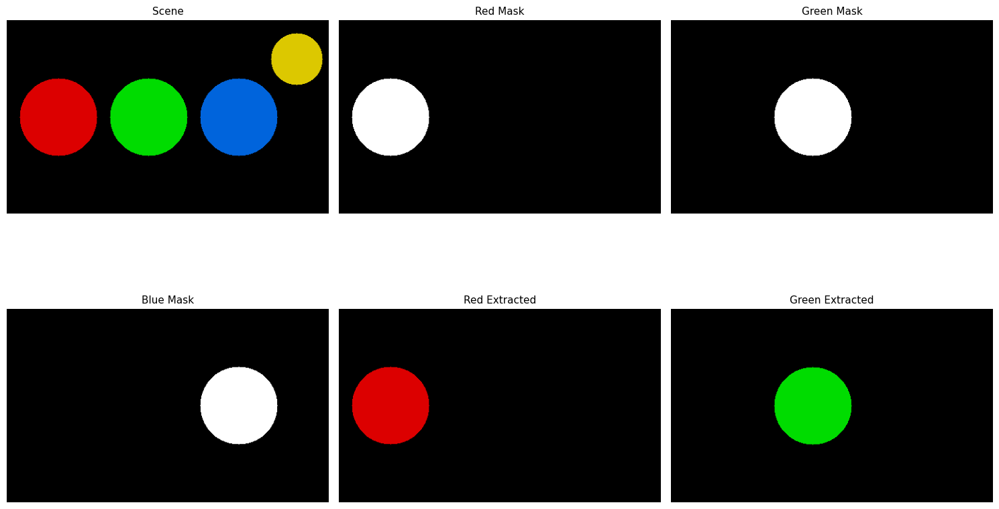

In [23]:
# ─── 5.2  Colour-based object detection (HSV masking) ────────────────────────
# Works well for: traffic lights, skin detection, specific product colours

# Create a synthetic scene with coloured blobs
scene = np.zeros((300, 500, 3), dtype=np.uint8)
cv2.circle(scene, (80,  150), 60, (0, 0, 220),   -1)   # Red
cv2.circle(scene, (220, 150), 60, (0, 220, 0),   -1)   # Green
cv2.circle(scene, (360, 150), 60, (220, 100, 0), -1)   # Blue
cv2.circle(scene, (450,  60), 40, (0, 200, 220), -1)   # Yellow-ish

hsv_scene = cv2.cvtColor(scene, cv2.COLOR_BGR2HSV)

# Mask for red (wraps around 0° in HSV)
mask_red1 = cv2.inRange(hsv_scene, np.array([0,150,100]),  np.array([10,255,255]))
mask_red2 = cv2.inRange(hsv_scene, np.array([170,150,100]),np.array([180,255,255]))
mask_red  = cv2.bitwise_or(mask_red1, mask_red2)

# Mask for green
mask_green= cv2.inRange(hsv_scene, np.array([40,100,100]), np.array([80,255,255]))

# Mask for blue
mask_blue = cv2.inRange(hsv_scene, np.array([100,100,100]),np.array([130,255,255]))

# Extract only red pixels
red_result  = cv2.bitwise_and(scene, scene, mask=mask_red)
green_result= cv2.bitwise_and(scene, scene, mask=mask_green)

show_multi(
    [scene, mask_red, mask_green, mask_blue, red_result, green_result],
    ['Scene', 'Red Mask', 'Green Mask', 'Blue Mask',
     'Red Extracted', 'Green Extracted'],
    cols=3, figsize=(15,10)
)

---
## 6 · YOLO with Ultralytics

<div style="background:#1a1a2e;border-left:4px solid #00d4ff;padding:16px;border-radius:6px;color:#e0e0e0">
<b>YOLO (You Only Look Once)</b> — a single neural network pass predicts bounding boxes <i>and</i> class probabilities simultaneously. Dramatically faster than two-stage detectors like Faster R-CNN.
</div>

### YOLO Version Timeline

| Year | Version | Key Innovation |
|------|---------|----------------|
| 2015 | YOLOv1  | Grid-based single-pass detection |
| 2016 | YOLOv2  | Anchor boxes, Darknet-19 |
| 2018 | YOLOv3  | Multi-scale prediction, Darknet-53 |
| 2020 | YOLOv4  | CSP, PANet, Mish activation |
| 2020 | YOLOv5  | PyTorch, AutoAnchor, ultralytics API |
| 2022 | YOLOv8  | Anchor-free, modular tasks |
| 2023 | YOLOv9  | PGI, GELAN backbone |
| 2024 | YOLO11  | C3k2 + SPPF + C2PSA, best accuracy/speed |

### 6.1  Quick Start

In [24]:
# ─── Install ultralytics (first time only) ────────────────────────────────────
# !pip install ultralytics

from ultralytics import YOLO
import torch

device = 'cuda' if torch.cuda.is_available() else 'cpu'
print(f'Device: {device}')

# Load pretrained model (downloads ~6MB on first run)
# Available: yolo11n, yolo11s, yolo11m, yolo11l, yolo11x
#  n=nano (fastest), x=extra-large (most accurate)
model = YOLO('yolo11n.pt')   # YOLO11 Nano — perfect for laptops

print(model.info(verbose=False))

Device: cpu
None


Detected 5 objects:
Class           Confidence BBox (x1,y1,x2,y2)
────────────────────────────────────────────────────────────
bus                   0.94   [20, 230, 806, 735]
person                0.89   [671, 394, 809, 878]
person                0.88   [47, 399, 239, 904]
person                0.86   [223, 408, 344, 860]
person                0.63   [0, 556, 69, 872]


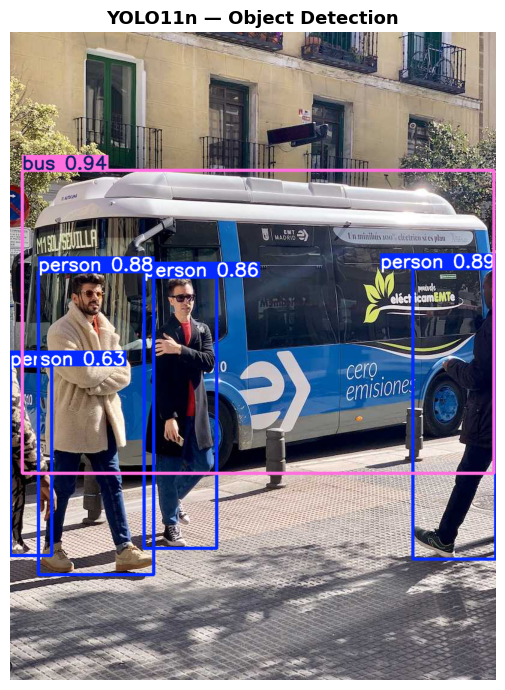

In [25]:
# ─── 6.2  Detect objects in an image ─────────────────────────────────────────
import urllib.request

# Download a street scene
test_url  = 'https://ultralytics.com/images/bus.jpg'
test_path = 'cv_assets/bus.jpg'
if not os.path.exists(test_path):
    urllib.request.urlretrieve(test_url, test_path)

# Run inference
results = model.predict(
    source=test_path,
    conf=0.3,          # confidence threshold
    iou=0.45,          # NMS IoU threshold
    device=device,
    verbose=False
)

res = results[0]

# ── Parse predictions ─────────────────────────────────────────────────────────
print(f'Detected {len(res.boxes)} objects:')
print(f'{"Class":<15} {"Confidence":>10} {"BBox (x1,y1,x2,y2)"}')
print('─'*60)
for box in res.boxes:
    cls_id = int(box.cls[0])
    cls_nm = model.names[cls_id]
    conf   = float(box.conf[0])
    coords = box.xyxy[0].tolist()
    print(f'{cls_nm:<15} {conf:>10.2f}   {[int(c) for c in coords]}')

# ── Visualise ─────────────────────────────────────────────────────────────────
annotated = res.plot()   # returns BGR numpy array
show(annotated, 'YOLO11n — Object Detection', figsize=(12,7))

In [26]:
# ─── 6.3  All YOLO tasks ──────────────────────────────────────────────────────
print("""
YOLO Task Reference
═══════════════════════════════════════════════════════════════════
Task           Model            Output
───────────────────────────────────────────────────────────────────
Detect         yolo11n.pt       Bounding boxes + class labels
Segment        yolo11n-seg.pt   Boxes + pixel masks
Classify       yolo11n-cls.pt   Top-N class probabilities
Pose           yolo11n-pose.pt  17 keypoints (COCO skeleton)
OBB            yolo11n-obb.pt   Oriented (rotated) bounding boxes
═══════════════════════════════════════════════════════════════════

Quick API
─────────────────────────────────────────────────────────────────
# Detect
results = model.predict('image.jpg', conf=0.3)
results[0].boxes.xyxy    # [N,4] tensor of boxes
results[0].boxes.cls     # [N]   class indices
results[0].boxes.conf    # [N]   confidences

# Segment
seg_model = YOLO('yolo11n-seg.pt')
results = seg_model.predict('image.jpg')
results[0].masks.data    # [N,H,W] boolean masks

# Video stream
for result in model.predict(source=0, stream=True):   # source=0 = webcam
    frame = result.plot()
    cv2.imshow('YOLO', frame)
    if cv2.waitKey(1) == ord('q'): break
""")


YOLO Task Reference
═══════════════════════════════════════════════════════════════════
Task           Model            Output
───────────────────────────────────────────────────────────────────
Detect         yolo11n.pt       Bounding boxes + class labels
Segment        yolo11n-seg.pt   Boxes + pixel masks
Classify       yolo11n-cls.pt   Top-N class probabilities
Pose           yolo11n-pose.pt  17 keypoints (COCO skeleton)
OBB            yolo11n-obb.pt   Oriented (rotated) bounding boxes
═══════════════════════════════════════════════════════════════════

Quick API
─────────────────────────────────────────────────────────────────
# Detect
results = model.predict('image.jpg', conf=0.3)
results[0].boxes.xyxy    # [N,4] tensor of boxes
results[0].boxes.cls     # [N]   class indices
results[0].boxes.conf    # [N]   confidences

# Segment
seg_model = YOLO('yolo11n-seg.pt')
results = seg_model.predict('image.jpg')
results[0].masks.data    # [N,H,W] boolean masks

# Video stream
for result 

In [27]:
# ─── 6.4  Fine-tune YOLO on custom data ──────────────────────────────────────
print("""
Custom Training Workflow
════════════════════════════════════════════════════════════════

1. Prepare dataset in YOLO format:
   dataset/
     images/train/  *.jpg
     images/val/    *.jpg
     labels/train/  *.txt   ← one file per image
     labels/val/    *.txt
     data.yaml

   Label format (one object per line):
   <class_id> <cx> <cy> <w> <h>   ← all normalised 0-1

2. data.yaml:
   path: ./dataset
   train: images/train
   val:   images/val
   nc: 2                    # number of classes
   names: ['cat', 'dog']

3. Train:
   from ultralytics import YOLO
   model = YOLO('yolo11n.pt')          # start from pretrained
   results = model.train(
       data='data.yaml',
       epochs=50,
       imgsz=640,
       batch=16,
       device=0,            # GPU id or 'cpu'
       project='runs',
       name='my_detector'
   )

4. Evaluate:
   metrics = model.val()               # mAP50, mAP50-95, P, R

5. Export:
   model.export(format='onnx')         # or 'tensorrt', 'coreml'
════════════════════════════════════════════════════════════════
💡 Labelling tools: Roboflow, LabelImg, CVAT, Label Studio
""")


Custom Training Workflow
════════════════════════════════════════════════════════════════

1. Prepare dataset in YOLO format:
   dataset/
     images/train/  *.jpg
     images/val/    *.jpg
     labels/train/  *.txt   ← one file per image
     labels/val/    *.txt
     data.yaml

   Label format (one object per line):
   <class_id> <cx> <cy> <w> <h>   ← all normalised 0-1

2. data.yaml:
   path: ./dataset
   train: images/train
   val:   images/val
   nc: 2                    # number of classes
   names: ['cat', 'dog']

3. Train:
   from ultralytics import YOLO
   model = YOLO('yolo11n.pt')          # start from pretrained
   results = model.train(
       data='data.yaml',
       epochs=50,
       imgsz=640,
       batch=16,
       device=0,            # GPU id or 'cpu'
       project='runs',
       name='my_detector'
   )

4. Evaluate:
   metrics = model.val()               # mAP50, mAP50-95, P, R

5. Export:
   model.export(format='onnx')         # or 'tensorrt', 'coreml'
═════════

---
## 7 · Application 1 — Face Blur (Privacy Tool)

**Goal:** Automatically detect faces and blur/pixelate them — useful for anonymising photos or videos.

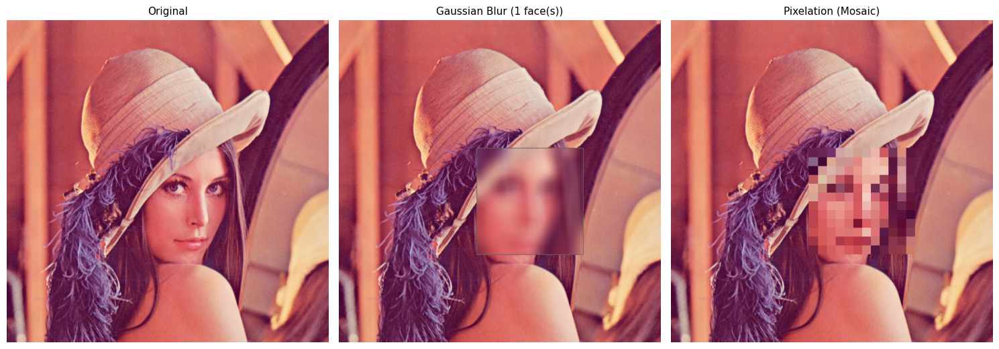

✅ 1 face(s) anonymised


In [28]:
# ─── Face Blur ────────────────────────────────────────────────────────────────
def blur_faces(image_path, blur_strength=25):
    """
    Detect faces with Haar cascade and apply pixelation blur.
    Returns (original, blurred) images.
    """
    img = cv2.imread(image_path)
    result = img.copy()
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    faces = face_cascade.detectMultiScale(
        gray, scaleFactor=1.1, minNeighbors=5, minSize=(30,30)
    )

    for (x, y, w, h) in faces:
        roi = result[y:y+h, x:x+w]

        # Method 1: Gaussian blur
        k = blur_strength | 1          # must be odd
        blurred_roi = cv2.GaussianBlur(roi, (k,k), 30)
        result[y:y+h, x:x+w] = blurred_roi

        # Draw subtle border
        cv2.rectangle(result, (x,y), (x+w,y+h), (100,100,100), 1)

    return img, result, len(faces)


def pixelate_region(image, x, y, w, h, blocks=10):
    """Pixelate a rectangular region (mosaic effect)."""
    roi = image[y:y+h, x:x+w]
    # Shrink then enlarge → blocky pixels
    small = cv2.resize(roi, (blocks, blocks), interpolation=cv2.INTER_LINEAR)
    pixelated = cv2.resize(small, (w, h), interpolation=cv2.INTER_NEAREST)
    image[y:y+h, x:x+w] = pixelated
    return image


original, blurred, n_faces = blur_faces(sample_path)

# Also demonstrate pixelation
pixelated_result = original.copy()
gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, scaleFactor=1.1, minNeighbors=5)
for (x,y,w,h) in faces:
    pixelated_result = pixelate_region(pixelated_result, x, y, w, h, blocks=12)

show_multi(
    [original, blurred, pixelated_result],
    ['Original', f'Gaussian Blur ({n_faces} face(s))', 'Pixelation (Mosaic)'],
    figsize=(15,6)
)
print(f'✅ {n_faces} face(s) anonymised')

In [29]:
# ─── Standalone script: face_blur.py ─────────────────────────────────────────
face_blur_script = '''
#!/usr/bin/env python
"""face_blur.py — Real-time face anonymisation from webcam."""
import cv2, urllib.request, os

CASCADE_PATH = 'haarcascade_frontalface_default.xml'
if not os.path.exists(CASCADE_PATH):
    url = 'https://raw.githubusercontent.com/opencv/opencv/master/data/haarcascades/' + CASCADE_PATH
    urllib.request.urlretrieve(url, CASCADE_PATH)

face_cascade = cv2.CascadeClassifier(CASCADE_PATH)
cap = cv2.VideoCapture(0)

blur_mode = True   # toggle with SPACE

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(60,60))

    if blur_mode:
        for (x, y, w, h) in faces:
            frame[y:y+h, x:x+w] = cv2.GaussianBlur(
                frame[y:y+h, x:x+w], (55,55), 30)

    cv2.putText(frame, f\'Faces: {len(faces)}  [SPACE]=toggle  [Q]=quit\',
                (10,30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,255,255), 2)
    cv2.imshow(\'Face Blur\', frame)

    key = cv2.waitKey(1) & 0xFF
    if key == ord(\'q\'): break
    if key == ord(\' \'): blur_mode = not blur_mode

cap.release()
cv2.destroyAllWindows()
'''
with open('face_blur.py', 'w') as f:
    f.write(face_blur_script)
print('✅ Saved: face_blur.py  →  run with: python face_blur.py')

✅ Saved: face_blur.py  →  run with: python face_blur.py


---
## 8 · Application 2 — Real-Time Object Counter

**Goal:** Count specific objects in a scene — useful for inventory, crowd counting, vehicle counting.

Object counts: {'bus': 1, 'person': 4}


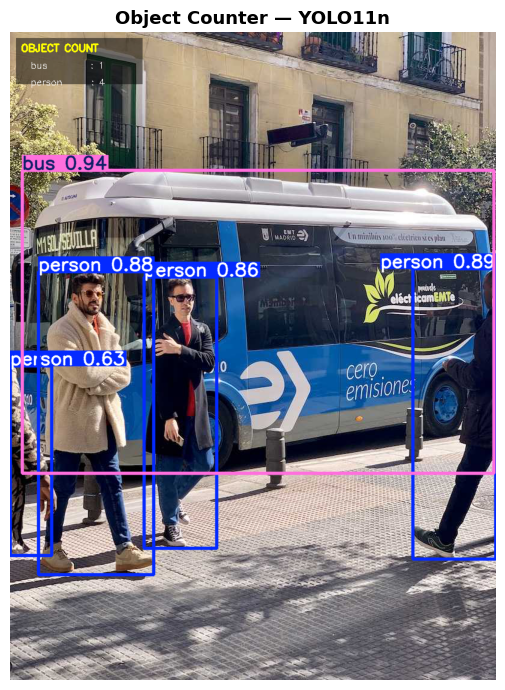

In [30]:
# ─── Object Counter using YOLO ────────────────────────────────────────────────
from collections import Counter

def count_objects(image_path_or_array, target_classes=None, conf=0.3):
    """
    Count objects by class in an image.
    target_classes: list of class names to track (None = all)
    Returns: annotated image, counts dict
    """
    results = model.predict(source=image_path_or_array,
                            conf=conf, verbose=False)
    res = results[0]

    counts = Counter()
    for box in res.boxes:
        cls_nm = model.names[int(box.cls[0])]
        if target_classes is None or cls_nm in target_classes:
            counts[cls_nm] += 1

    annotated = res.plot()

    # Overlay counter panel
    panel_h = 30 + len(counts) * 28
    overlay = annotated.copy()
    cv2.rectangle(overlay, (10,10), (220, panel_h), (0,0,0), -1)
    annotated = cv2.addWeighted(overlay, 0.5, annotated, 0.5, 0)

    cv2.putText(annotated, 'OBJECT COUNT', (18,32),
                cv2.FONT_HERSHEY_SIMPLEX, 0.55, (0,255,255), 2)
    for i, (cls_nm, cnt) in enumerate(sorted(counts.items())):
        y = 32 + (i+1)*28
        cv2.putText(annotated, f'  {cls_nm:<12}: {cnt}', (18, y),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255,255,255), 1)

    return annotated, dict(counts)


# Run on bus image
annotated, counts = count_objects('cv_assets/bus.jpg')
print('Object counts:', counts)
show(annotated, 'Object Counter — YOLO11n', figsize=(12,7))

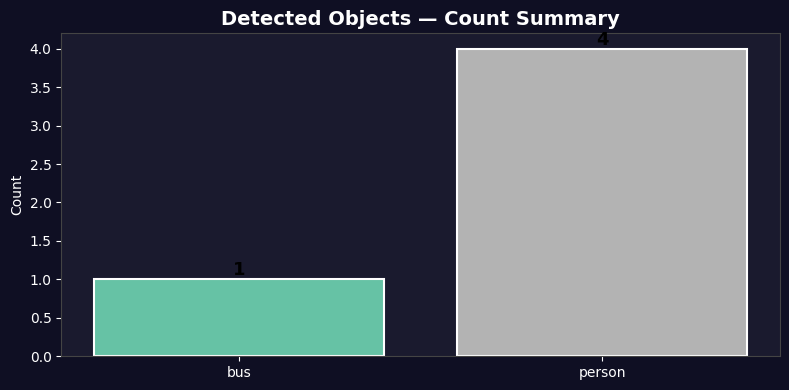

In [31]:
# ─── Bar chart of counts ──────────────────────────────────────────────────────
if counts:
    fig, ax = plt.subplots(figsize=(8,4))
    classes = list(counts.keys())
    values  = list(counts.values())
    colors = plt.cm.Set2(np.linspace(0,1,len(classes)))
    bars = ax.bar(classes, values, color=colors, edgecolor='white', linewidth=1.5)
    ax.bar_label(bars, fontsize=13, fontweight='bold')
    ax.set_title('Detected Objects — Count Summary', fontsize=14, fontweight='bold')
    ax.set_ylabel('Count')
    ax.set_facecolor('#1a1a2e')
    fig.patch.set_facecolor('#0f0f23')
    ax.tick_params(colors='white')
    ax.title.set_color('white')
    ax.yaxis.label.set_color('white')
    for spine in ax.spines.values(): spine.set_color('#444')
    plt.tight_layout()
    plt.show()

In [32]:
# ─── Standalone script: object_counter.py ────────────────────────────────────
counter_script = '''
#!/usr/bin/env python
"""object_counter.py — Live YOLO object counter from webcam."""
import cv2
from ultralytics import YOLO
from collections import Counter
import time

model = YOLO(\'yolo11n.pt\')
cap   = cv2.VideoCapture(0)
cap.set(cv2.CAP_PROP_FRAME_WIDTH, 1280)
cap.set(cv2.CAP_PROP_FRAME_HEIGHT, 720)

prev_t = time.time()

for result in model.predict(source=cap, stream=True, conf=0.4, verbose=False):
    frame  = result.plot()
    counts = Counter(model.names[int(b.cls[0])] for b in result.boxes)

    # FPS
    now   = time.time()
    fps   = 1 / (now - prev_t + 1e-6)
    prev_t = now

    # Overlay
    cv2.putText(frame, f\'FPS: {fps:.1f}\', (10,30),
                cv2.FONT_HERSHEY_SIMPLEX, 1, (0,255,0), 2)
    for i,(cls,cnt) in enumerate(sorted(counts.items())):
        cv2.putText(frame, f\'{cls}: {cnt}\', (10, 65+i*30),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.8, (255,255,0), 2)

    cv2.imshow(\'Object Counter\', frame)
    if cv2.waitKey(1) & 0xFF == ord(\'q\'): break

cv2.destroyAllWindows()
'''
with open('object_counter.py', 'w') as f:
    f.write(counter_script)
print('✅ Saved: object_counter.py  →  run with: python object_counter.py')

✅ Saved: object_counter.py  →  run with: python object_counter.py


---
## 9 · Application 3 — Motion Detector

**Goal:** Detect movement between video frames — used in surveillance, security cameras, automated lighting.

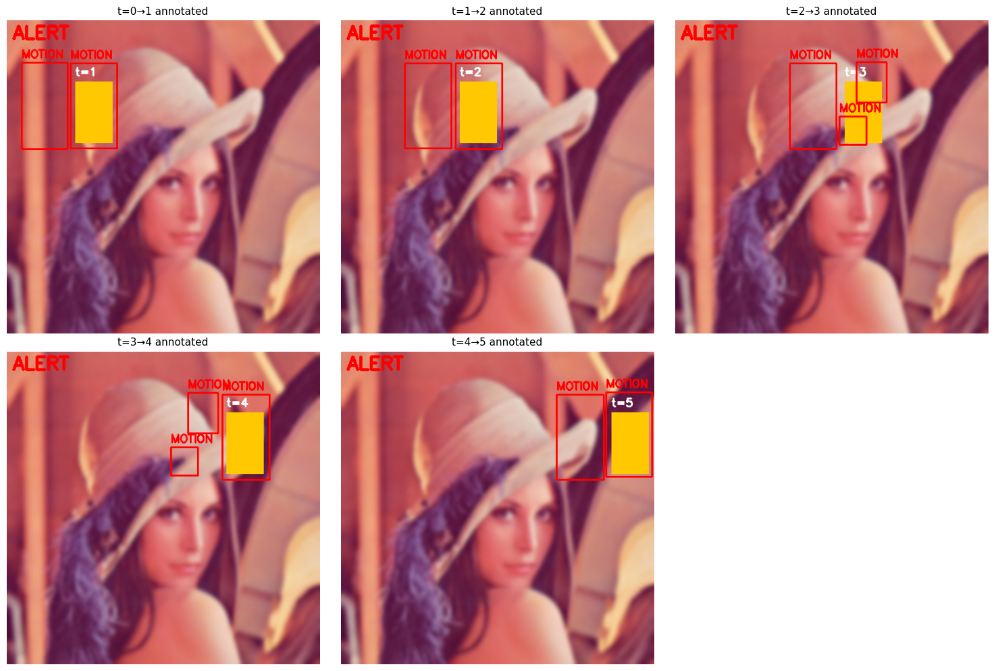

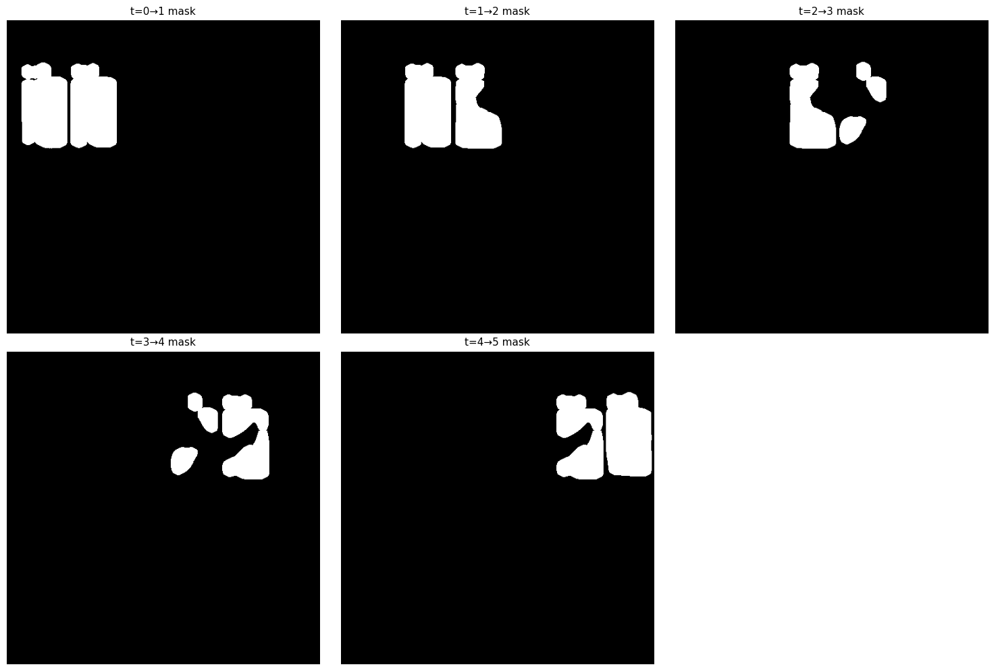

In [33]:
# ─── Motion Detection (Frame Differencing) ────────────────────────────────────
def simulate_motion_frames(base_img, n=6):
    """Simulate a scene with an 'object' moving across it."""
    H, W = base_img.shape[:2]
    frames = []
    bg = cv2.GaussianBlur(base_img, (21,21), 0)  # blurred background
    for i in range(n):
        frame = bg.copy()
        # Moving rectangle (simulated object)
        x = 30 + i * (W-100) // (n-1)
        cv2.rectangle(frame, (x,100), (x+60,200), (0,200,255), -1)
        cv2.putText(frame, f't={i}', (x,90),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (255,255,255), 2)
        frames.append(frame)
    return frames


def detect_motion(prev, curr, threshold=25, min_area=500):
    """
    Frame-differencing motion detector.
    Returns: annotated frame, motion mask, list of bounding boxes
    """
    g1 = cv2.cvtColor(cv2.GaussianBlur(prev,(21,21),0), cv2.COLOR_BGR2GRAY)
    g2 = cv2.cvtColor(cv2.GaussianBlur(curr,(21,21),0), cv2.COLOR_BGR2GRAY)

    diff  = cv2.absdiff(g1, g2)
    _, mask = cv2.threshold(diff, threshold, 255, cv2.THRESH_BINARY)

    # Clean mask
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))
    mask = cv2.dilate(mask, kernel, iterations=3)

    # Find motion regions
    contours, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    annotated = curr.copy()
    boxes = []
    for cnt in contours:
        if cv2.contourArea(cnt) < min_area:
            continue
        x,y,w,h = cv2.boundingRect(cnt)
        boxes.append((x,y,w,h))
        cv2.rectangle(annotated, (x,y),(x+w,y+h),(0,0,255),2)
        cv2.putText(annotated,'MOTION',(x,y-8),
                    cv2.FONT_HERSHEY_SIMPLEX,0.6,(0,0,255),2)

    status = 'ALERT' if boxes else 'CLEAR'
    color  = (0,0,255) if boxes else (0,200,0)
    cv2.putText(annotated, status, (10,30),
                cv2.FONT_HERSHEY_SIMPLEX, 1.0, color, 3)

    return annotated, mask, boxes


# Simulate 6 frames
sim_frames = simulate_motion_frames(img, n=6)

results_imgs  = []
results_masks = []

for i in range(1, len(sim_frames)):
    annotated, mask, boxes = detect_motion(sim_frames[i-1], sim_frames[i])
    results_imgs.append(annotated)
    results_masks.append(mask)

show_multi(results_imgs,  [f't={i}→{i+1} annotated' for i in range(len(results_imgs))],
           cols=3, figsize=(15,10))
show_multi(results_masks, [f't={i}→{i+1} mask'      for i in range(len(results_masks))],
           cols=3, figsize=(15,10))


Advanced Motion: Background Subtraction
════════════════════════════════════════════════════════════════
Background subtractors build an adaptive background model and
flag pixels that deviate from it — more robust than frame diff.

  # MOG2 — Gaussian Mixture Model
  fgbg = cv2.createBackgroundSubtractorMOG2(
      history=500, varThreshold=16, detectShadows=True)

  # KNN — K-Nearest Neighbours
  fgbg = cv2.createBackgroundSubtractorKNN()

  # Per-frame usage:
  fgmask = fgbg.apply(frame)     # returns binary foreground mask
  bg     = fgbg.getBackgroundImage()  # estimated background

Use case: parking lots, conveyor belt inspection, crowd monitoring
════════════════════════════════════════════════════════════════



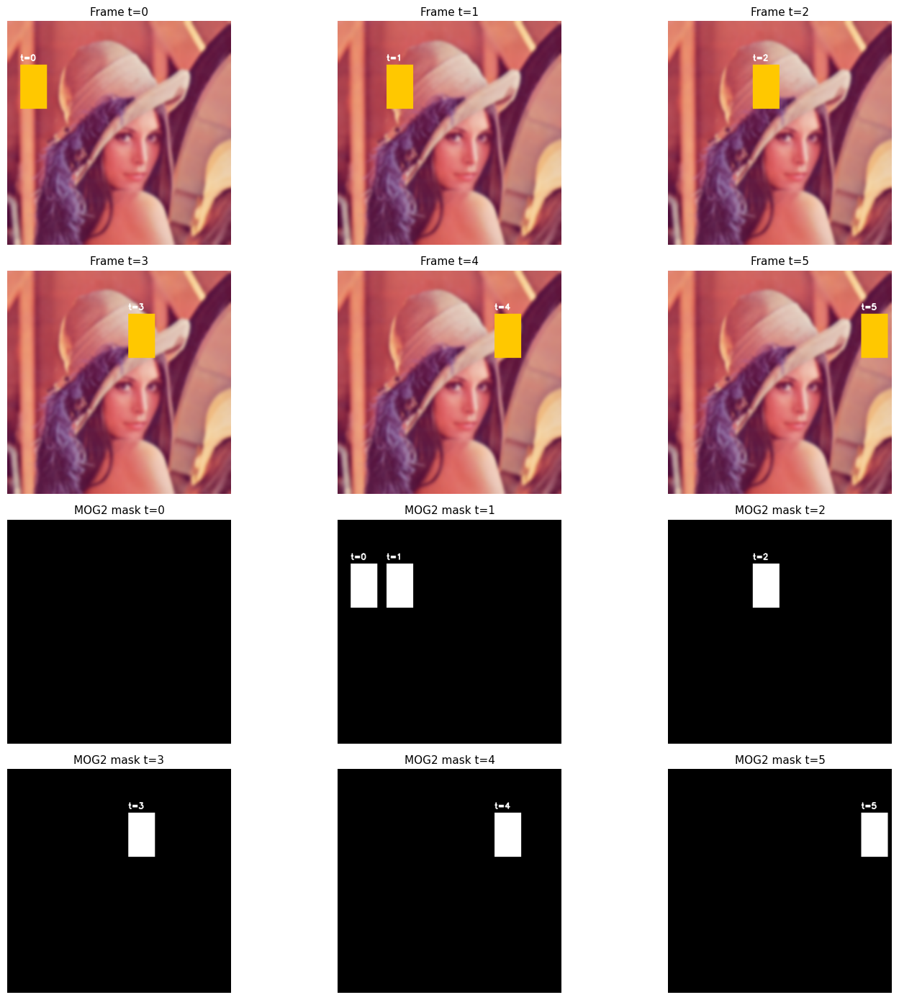

In [34]:
# ─── Background Subtraction (MOG2 / KNN) ─────────────────────────────────────
print("""
Advanced Motion: Background Subtraction
════════════════════════════════════════════════════════════════
Background subtractors build an adaptive background model and
flag pixels that deviate from it — more robust than frame diff.

  # MOG2 — Gaussian Mixture Model
  fgbg = cv2.createBackgroundSubtractorMOG2(
      history=500, varThreshold=16, detectShadows=True)

  # KNN — K-Nearest Neighbours
  fgbg = cv2.createBackgroundSubtractorKNN()

  # Per-frame usage:
  fgmask = fgbg.apply(frame)     # returns binary foreground mask
  bg     = fgbg.getBackgroundImage()  # estimated background

Use case: parking lots, conveyor belt inspection, crowd monitoring
════════════════════════════════════════════════════════════════
""")

# Demo with synthetic frames
bg_subtractor = cv2.createBackgroundSubtractorMOG2(history=100, varThreshold=40)

masks_mog2 = []
for frame in sim_frames:
    mask = bg_subtractor.apply(frame)
    masks_mog2.append(mask)

show_multi(
    sim_frames + masks_mog2,
    [f'Frame t={i}' for i in range(len(sim_frames))] +
    [f'MOG2 mask t={i}' for i in range(len(masks_mog2))],
    cols=3, figsize=(15,14)
)

In [35]:
# ─── Standalone script: motion_detector.py ───────────────────────────────────
motion_script = '''
#!/usr/bin/env python
"""motion_detector.py — Webcam motion detection with alert overlay."""
import cv2, time

cap = cv2.VideoCapture(0)
fgbg = cv2.createBackgroundSubtractorMOG2(history=300, varThreshold=25, detectShadows=False)
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5,5))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret: break

    blurred = cv2.GaussianBlur(frame, (11,11), 0)
    fgmask  = fgbg.apply(blurred)
    fgmask  = cv2.dilate(fgmask, kernel, iterations=2)

    contours, _ = cv2.findContours(fgmask, cv2.RETR_EXTERNAL,
                                   cv2.CHAIN_APPROX_SIMPLE)
    motion = False
    for cnt in contours:
        if cv2.contourArea(cnt) < 1500: continue
        x,y,w,h = cv2.boundingRect(cnt)
        cv2.rectangle(frame,(x,y),(x+w,y+h),(0,0,255),2)
        motion = True

    label = \'⚠ MOTION DETECTED\' if motion else \'CLEAR\'
    color = (0,0,255) if motion else (0,200,0)
    cv2.putText(frame, label, (10,35), cv2.FONT_HERSHEY_SIMPLEX, 1.1, color, 3)
    cv2.putText(frame, time.strftime(\' %H:%M:%S\'), (10,65),
                cv2.FONT_HERSHEY_SIMPLEX, 0.6, (200,200,200), 1)

    cv2.imshow(\'Motion Detector\', frame)
    cv2.imshow(\'FG Mask\', fgmask)
    if cv2.waitKey(1) & 0xFF == ord(\'q\'): break

cap.release()
cv2.destroyAllWindows()
'''
with open('motion_detector.py', 'w') as f:
    f.write(motion_script)
print('✅ Saved: motion_detector.py  →  run with: python motion_detector.py')

✅ Saved: motion_detector.py  →  run with: python motion_detector.py


---
## 10 · Application 4 — Document Scanner

**Goal:** Detect a document/card in a photo, perform perspective correction, and output a clean scan — like CamScanner.

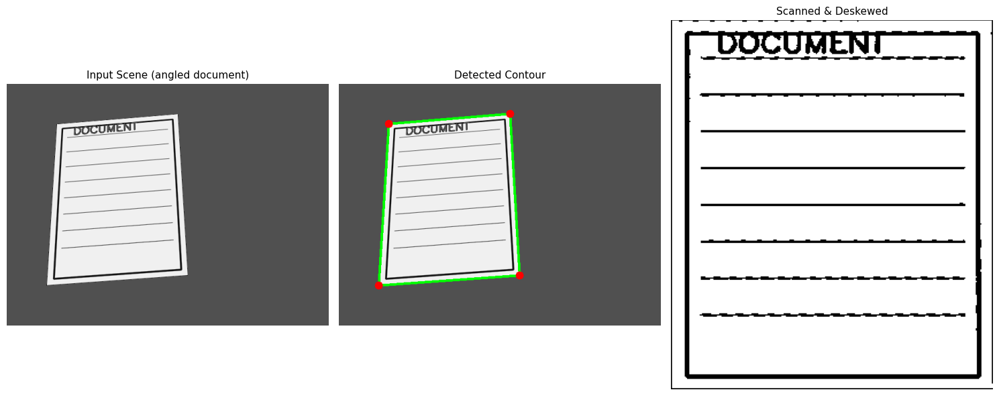

✅ Document scanned successfully!


In [36]:
# ─── Document Scanner ─────────────────────────────────────────────────────────
def order_points(pts):
    """Order 4 corner points: top-left, top-right, bottom-right, bottom-left."""
    rect = np.zeros((4,2), dtype=np.float32)
    s = pts.sum(axis=1)
    rect[0] = pts[np.argmin(s)]   # top-left     (min x+y)
    rect[2] = pts[np.argmax(s)]   # bottom-right  (max x+y)
    diff = np.diff(pts, axis=1)
    rect[1] = pts[np.argmin(diff)]  # top-right    (min y-x)
    rect[3] = pts[np.argmax(diff)]  # bottom-left  (max y-x)
    return rect


def four_point_transform(image, pts):
    """Apply perspective warp to flatten a quadrilateral region."""
    rect = order_points(pts)
    (tl, tr, br, bl) = rect

    # Compute output dimensions
    wA = np.linalg.norm(br - bl)
    wB = np.linalg.norm(tr - tl)
    hA = np.linalg.norm(tr - br)
    hB = np.linalg.norm(tl - bl)
    W = int(max(wA, wB))
    H = int(max(hA, hB))

    dst = np.array([[0,0],[W-1,0],[W-1,H-1],[0,H-1]], dtype=np.float32)
    M   = cv2.getPerspectiveTransform(rect, dst)
    warped = cv2.warpPerspective(image, M, (W, H))
    return warped


def scan_document(image):
    """
    Detect largest quadrilateral in image and warp it flat.
    Returns: (annotated, scanned) or (annotated, None) if not found.
    """
    orig = image.copy()
    H, W = image.shape[:2]

    # Preprocess
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blur = cv2.GaussianBlur(gray, (5,5), 0)
    edges= cv2.Canny(blur, 50, 150)
    edges= cv2.dilate(edges, np.ones((3,3),np.uint8), iterations=1)

    # Find contours, keep top-5 by area
    contours, _ = cv2.findContours(edges, cv2.RETR_LIST, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:5]

    doc_cnt = None
    for cnt in contours:
        peri   = cv2.arcLength(cnt, True)
        approx = cv2.approxPolyDP(cnt, 0.02*peri, True)
        if len(approx) == 4:          # quadrilateral found!
            doc_cnt = approx
            break

    annotated = orig.copy()
    if doc_cnt is None:
        cv2.putText(annotated, 'No document found', (20,50),
                    cv2.FONT_HERSHEY_SIMPLEX, 1, (0,0,255), 2)
        return annotated, None

    cv2.drawContours(annotated, [doc_cnt], -1, (0,255,0), 3)
    for pt in doc_cnt.reshape(-1,2):
        cv2.circle(annotated, tuple(pt), 8, (0,0,255), -1)

    warped = four_point_transform(orig, doc_cnt.reshape(4,2).astype(np.float32))

    # Post-process: adaptive threshold for clean scan look
    warped_gray = cv2.cvtColor(warped, cv2.COLOR_BGR2GRAY)
    scanned = cv2.adaptiveThreshold(warped_gray, 255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 21, 10)
    scanned = cv2.cvtColor(scanned, cv2.COLOR_GRAY2BGR)

    return annotated, scanned


# Create synthetic document scene
scene = np.ones((480, 640, 3), dtype=np.uint8) * 80   # gray table
doc = np.ones((300, 220, 3), dtype=np.uint8) * 240    # white paper
# Add text lines to the document
for i in range(8):
    y = 30 + i*30
    cv2.line(doc, (20, y), (200, y), (50,50,50), 1)
cv2.rectangle(doc, (10,10), (210,290), (20,20,20), 2)
cv2.putText(doc, 'DOCUMENT', (30,25), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0,0,0), 2)

# Apply perspective distortion (simulate phone photo angle)
src_pts = np.float32([[0,0],[220,0],[220,300],[0,300]])
dst_pts = np.float32([[100,80],[340,60],[360,380],[80,400]])
M_persp = cv2.getPerspectiveTransform(src_pts, dst_pts)
warped_doc = cv2.warpPerspective(doc, M_persp, (640,480))

# Composite onto scene
mask_doc = warped_doc.sum(axis=2) > 0
scene[mask_doc] = warped_doc[mask_doc]
cv2.imwrite('cv_assets/doc_scene.jpg', scene)

# Scan it
annotated, scanned = scan_document(scene)

if scanned is not None:
    show_multi([scene, annotated, scanned],
               ['Input Scene (angled document)', 'Detected Contour', 'Scanned & Deskewed'],
               figsize=(15,6))
    print('✅ Document scanned successfully!')
else:
    show_multi([scene, annotated], ['Input', 'Result'], figsize=(12,5))
    print('⚠ No quadrilateral found.')

In [37]:
# ─── Standalone script: doc_scanner.py ───────────────────────────────────────
scanner_script = '''
#!/usr/bin/env python
"""doc_scanner.py — Live document scanner from webcam."""
import cv2, numpy as np

def order_points(pts):
    rect = np.zeros((4,2), dtype=np.float32)
    s = pts.sum(axis=1)
    rect[0]=pts[np.argmin(s)]; rect[2]=pts[np.argmax(s)]
    diff = np.diff(pts, axis=1)
    rect[1]=pts[np.argmin(diff)]; rect[3]=pts[np.argmax(diff)]
    return rect

def warp(img, pts):
    rect=(tl,tr,br,bl)=order_points(pts)
    W=int(max(np.linalg.norm(br-bl),np.linalg.norm(tr-tl)))
    H=int(max(np.linalg.norm(tr-br),np.linalg.norm(tl-bl)))
    dst=np.array([[0,0],[W-1,0],[W-1,H-1],[0,H-1]],dtype=np.float32)
    return cv2.warpPerspective(img,cv2.getPerspectiveTransform(rect,dst),(W,H))

cap = cv2.VideoCapture(0)
scanned = None

while cap.isOpened():
    ret, frame = cap.read()
    if not ret: break
    display = frame.copy()
    gray=cv2.GaussianBlur(cv2.cvtColor(frame,cv2.COLOR_BGR2GRAY),(5,5),0)
    edges=cv2.dilate(cv2.Canny(gray,50,150),np.ones((3,3),np.uint8))
    cnts,_=cv2.findContours(edges,cv2.RETR_LIST,cv2.CHAIN_APPROX_SIMPLE)
    cnts=sorted(cnts,key=cv2.contourArea,reverse=True)[:5]
    for cnt in cnts:
        approx=cv2.approxPolyDP(cnt,0.02*cv2.arcLength(cnt,True),True)
        if len(approx)==4:
            cv2.drawContours(display,[approx],-1,(0,255,0),3)
            scanned=warp(frame,approx.reshape(4,2).astype(np.float32))
            break
    cv2.putText(display,\'[S]=save  [Q]=quit\',(10,30),
                cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,255),2)
    cv2.imshow(\'Scanner\',display)
    if scanned is not None: cv2.imshow(\'Scan Preview\',scanned)
    key=cv2.waitKey(1)&0xFF
    if key==ord(\'q\'): break
    if key==ord(\'s\') and scanned is not None:
        cv2.imwrite(\'scan_output.jpg\',scanned)
        print(\'Saved scan_output.jpg\')

cap.release(); cv2.destroyAllWindows()
'''
with open('doc_scanner.py', 'w') as f:
    f.write(scanner_script)
print('✅ Saved: doc_scanner.py  →  run with: python doc_scanner.py')

✅ Saved: doc_scanner.py  →  run with: python doc_scanner.py


---
## 📌 Summary & Quick Reference

<div style="background:linear-gradient(135deg,#0f2027,#203a43);padding:24px;border-radius:10px;color:#e0e0e0">

### OpenCV Core API

| Operation | Code |
|-----------|------|
| Read image | `cv2.imread('f.jpg')` |
| Write image | `cv2.imwrite('out.jpg', img)` |
| Resize | `cv2.resize(img, (W,H))` |
| Color convert | `cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)` |
| Draw rectangle | `cv2.rectangle(img,(x1,y1),(x2,y2),(B,G,R),t)` |
| Draw circle | `cv2.circle(img,(cx,cy),r,(B,G,R),t)` |
| Put text | `cv2.putText(img,'txt',(x,y),font,scale,color,t)` |
| Blur | `cv2.GaussianBlur(img,(k,k),0)` |
| Edges | `cv2.Canny(img,low,high)` |
| Threshold | `cv2.threshold(gray,127,255,cv2.THRESH_BINARY)` |
| Contours | `cv2.findContours(mask,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_SIMPLE)` |
| Perspective | `cv2.getPerspectiveTransform(src,dst)` + `cv2.warpPerspective` |

### YOLO Quick API

```python
from ultralytics import YOLO
model   = YOLO('yolo11n.pt')                      # load
results = model.predict('image.jpg', conf=0.3)    # detect
frame   = results[0].plot()                       # annotate
model.train(data='data.yaml', epochs=50)          # train
model.val()                                       # evaluate
model.export(format='onnx')                       # export
```

### Applications Built

| Script | Description | Run |
|--------|-------------|-----|
| `face_blur.py` | Real-time face anonymisation | `python face_blur.py` |
| `object_counter.py` | Live YOLO object counter | `python object_counter.py` |
| `motion_detector.py` | MOG2 motion alert system | `python motion_detector.py` |
| `doc_scanner.py` | Perspective-corrected doc scan | `python doc_scanner.py` |

</div>

---

<div style="background:#0f2027;padding:16px;border-radius:8px;text-align:center;color:#a0c4d8;font-size:0.9em">
TCHAPGA TCHITO C. &nbsp;·&nbsp; University of Buea — College of Technology &nbsp;·&nbsp; 2025/2026
</div>